In [ ]:
!pip install ipympl

In [2]:
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import Audio

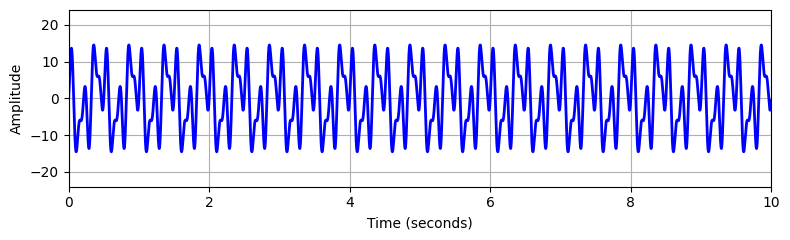

In [150]:


def generate_sinusoid(dur=1, amp=1, freq=1, phase=0, Fs=100):

    num_samples = int(Fs * dur)
    t = np.arange(num_samples) / Fs
    x = amp * np.sin(2 * np.pi * (freq * t - phase))
    return x, t


amp1 = 7
freq1 = 2
phase1 = 0.6


amp2 = 8
freq2 = 6
phase2 = 0

amp3 = 5
freq3 = 10
phase3 = 0.2

dur=100
Fs=44000

x1, t = generate_sinusoid(dur=dur, amp=amp1, freq=freq1, phase=phase1, Fs=Fs)
x2, t = generate_sinusoid(dur=dur, amp=amp2, freq=freq2, phase=phase2, Fs=Fs)
x3, t = generate_sinusoid(dur=dur, amp=amp3, freq=freq3, phase=phase3, Fs=Fs)
x = x1 + x2 + x3
plt.figure(figsize=(8, 2.5))
plt.plot(t, x, color='blue', linewidth=2.0, linestyle='-')
plt.xlim([0, t[10*Fs]])
plt.ylim([-(amp1+amp2+amp3)*1.2, (amp1+amp2+amp3)*1.2])
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')

plt.grid()
plt.tight_layout()
plt.show()

In [151]:
Audio(x, rate=44000)

In [195]:
import csv

def get_time_power_mov_avg(filename):
    with open(filename, 'r') as csvfile:
        csvreader = csv.reader(csvfile)
        power_value = []
        time_index = []
        first_row = True
        for row in csvreader:
            if first_row:
                first_time = float(row[0]);
                first_row = False
            time_index.append(float(row[0])-first_time)
            power_value.append(float(row[1]))
        
        window_size=100
        moving_averages = []
        for i in range(len(power_value) - window_size + 1):
            window = power_value[i:i+window_size]
            avg = np.mean(window)
            moving_averages.append(avg)
        

    moving_averages = [0]*(window_size-1) + moving_averages;

    return time_index,power_value,moving_averages


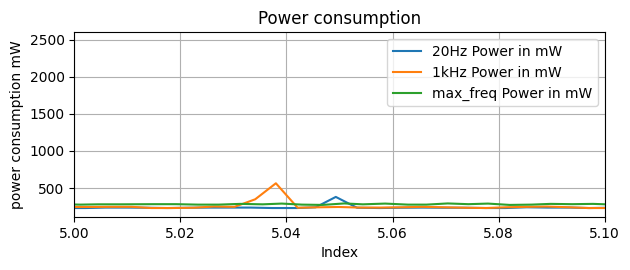

In [206]:
#values for 20Hz sampling
time_index_20,power_value_20,moving_averages_20 = get_time_power_mov_avg('./energy_measurements/20Hz_sampling.csv')
#values for 1kHz sampling
time_index_1k,power_value_1k,moving_averages_1k = get_time_power_mov_avg('./energy_measurements/1KHz_sampling.csv')
#values for max sampling
time_index_max,power_value_max,moving_averages_max = get_time_power_mov_avg('./energy_measurements/maximum_sampling.csv')


plt.subplot(2, 1, 1)
plt.plot(time_index_20,power_value_20, label="20Hz Power in mW")
plt.plot(time_index_1k,power_value_1k, label="1kHz Power in mW")
plt.plot(time_index_max,power_value_max, label="max_freq Power in mW")
#plt.plot(time_index,moving_averages, label="moving average mW")
plt.legend()
plt.xlabel('Index')
plt.xlim(5,5.1)
plt.ylabel('power consumption mW')
plt.title('Power consumption')
plt.grid(True)



plt.tight_layout()

plt.show()

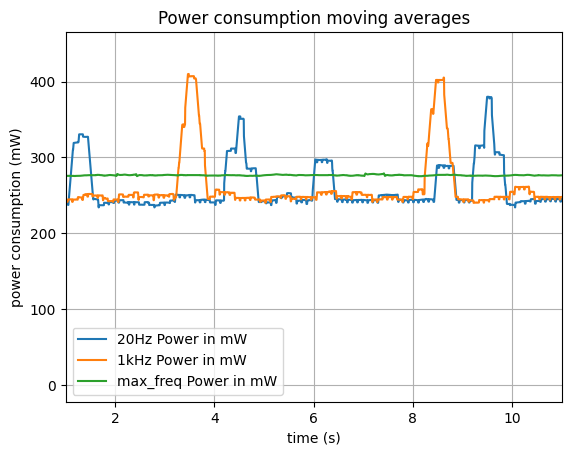

In [201]:
plt.plot(time_index_20,moving_averages_20, label="20Hz Power in mW")
plt.plot(time_index_1k,moving_averages_1k, label="1kHz Power in mW")
plt.plot(time_index_max,moving_averages_max, label="max_freq Power in mW")
#plt.plot(time_index,moving_averages, label="moving average mW")
plt.legend()
plt.xlabel('time (s)')

plt.ylabel('power consumption (mW)')
plt.xlim(1,11)
plt.title('Power consumption moving averages')
plt.grid(True)

plt.show()


In [205]:
print("Mean power consumption of 20Hz Sampling (with transmission):",np.mean(power_value_20))
print("Mean power consumption of 1kHz Sampling (with transmission):",np.mean(power_value_1k))
print("Mean power consumption of Max frequency Sampling (without transmission):",np.mean(power_value_max))

Mean power consumption of 20Hz Sampling (with transmission): 262.8284
Mean power consumption of 1kHz Sampling (with transmission): 265.9056
Mean power consumption of Max frequency Sampling (without transmission): 276.7808
